In [111]:
! pip install mediapy

In [10]:
from IPython.display import clear_output

# U gdown to install the video from google drive
!pip install gdown
!gdown https://drive.google.com/uc?id=1vRt-tPdzSvlHBLto6Ql-nWRtP7qJDAyy

Downloading...
From: https://drive.google.com/uc?id=1vRt-tPdzSvlHBLto6Ql-nWRtP7qJDAyy
To: /content/Assignment4.mp4
3.92MB [00:00, 123MB/s]


In [17]:
# Import libraries
%matplotlib inline
from matplotlib import pyplot as plt
import cv2
import numpy as np
from copy import deepcopy
import scipy.stats as st
import base64
from IPython.display import clear_output, Image
from skimage.metrics import structural_similarity as compare_ssim


# Set inline plots size
plt.rcParams["figure.figsize"] = (20, 20) # (w, h)


In [62]:
# Source: lab3 from ICV
def read_and_resize(filename, grayscale=False, fx=0.5, fy=0.5):
    if grayscale:
      img_result = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)
    else:
      imgbgr = cv2.imread(filename, cv2.IMREAD_COLOR)
      img_result = cv2.cvtColor(imgbgr, cv2.COLOR_BGR2RGB)
    img_result = cv2.resize(img_result, None, fx=fx, fy=fy, interpolation = cv2.INTER_CUBIC)
    return img_result

# Source: lab3 from ICV
def showInRow(list_of_images, titles = None, disable_ticks = False):
  count = len(list_of_images)
  for idx in range(count):
    subplot = plt.subplot(1, count, idx+1)
    if titles is not None:
      subplot.set_title(titles[idx])
      
    img = list_of_images[idx]
    cmap = 'gray' if (len(img.shape) == 2 or img.shape[2] == 1) else None
    subplot.imshow(img, cmap=cmap)
    if disable_ticks:
      plt.xticks([]), plt.yticks([])
  plt.show()

def cvt_resize(img, grayscale=False, fx=1, fy=1):
    img_resize = cv2.resize(img, None, fx=fx, fy=fy, interpolation = cv2.INTER_CUBIC)
    img_resize = img_resize[130:230,:]
    img_gray = cv2.cvtColor(img_resize,cv2.COLOR_BGR2GRAY)

    return img_gray, img_resize

In [11]:
# Just display the video
from IPython.display import HTML
from base64 import b64encode
 
def show_video(video_path, video_width = 600):
   
  video_file = open(video_path, "r+b").read()
 
  video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
  return HTML(f"""<video width={video_width} controls><source src="{video_url}"></video>""")
 
show_video("Assignment4.mp4")

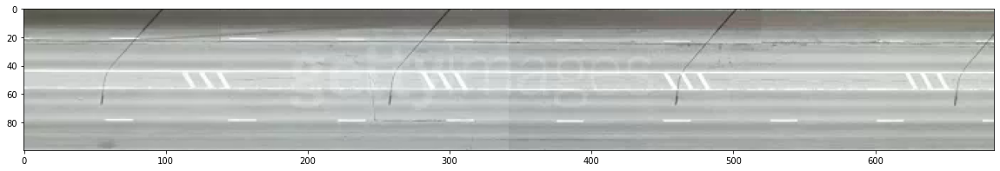

In [73]:
video_capture = cv2.VideoCapture("Assignment4.mp4")
# Getting the first frame
success, first_frame_original = video_capture.read()
first_frame_gray, first_frame = cvt_resize(first_frame_original)

# Getting the last frame
last_frame = None
while video_capture.isOpened():
    success, frame = video_capture.read()
    if(success):
        last_frame_gray, last_frame = cvt_resize(frame)
    else:
        break

# Preparing the background from two parts from two frames (first frame and the last frame)
# As the first frame has a car in the left part and the rest is empty
# and the last frame has a car in the right part and the rest is empty
bg = deepcopy(last_frame)
# Merge part of the first frame and the other part of the last part to be the background
bg[:,:bg.shape[1]//2] = first_frame[:,:bg.shape[1]//2]

showInRow([bg])

In [ ]:
# Source: Assignment 2: ICV course
def IoU(box1, box2):
    """
    box1: [x,y,w,h] coordinates of the ground truth box
    box2: [x,y,w,h] coordinates of the predicted box
    return: IoU between two boxes if they are overlapping, 0 otherwise
    x1,y1,x2,y2
    with
    x1, y1:  coordinates of the upper left corner
    x2, y2: coordinates of the lower right corner
    """
    # determine coordinates of the intersection
    box1 = [box1[0], box1[1], box1[0]+box1[2], box1[1]+box1[3]]
    box2 = [box2[0], box2[1], box2[0]+box2[2], box2[1]+box2[3]]
    
    left_x = max(box2[0], box1[0])
    bottom_y = min(box2[3], box1[3])
    right_x = min(box2[2], box1[2])
    top_y = max(box2[1], box1[1])
    
    # compute intersection area
    interArea = abs(max((right_x - left_x), 0) * max((bottom_y - top_y), 0))

    # compute the area of both the prediction and ground-truth
    ground_area = abs((box1[0] - box1[2]) * (box1[1] - box1[3]))
    predicted_area = abs((box2[0] - box2[2]) * (box2[1] - box2[3]))
    # compute the IoU
    return interArea / (ground_area+predicted_area-interArea)


# No motorcycles detection
# I have sacraficed the motorcycles in my implementation as they are too small and they are merging with cars when I make erosion 1 iteration, this happened when the following is being used instead of the current ones
# erosion = cv2.erode(diff_th, np.ones((5,5),np.uint8), iterations = 1)
# erosion = cv2.erode(erosion, np.ones((3,3),np.uint8), iterations = 1)
def prep_frame(frame, bg, prev_frame, tails):
    offset = 130    # Offset of the cropping, in order to merge the results later
    # Resize and crop the frame
    frame_gray, frame_resized = cvt_resize(frame)
    # Get the differences between two frames
    (score, diff) = compare_ssim(frame_resized, bg, full=True, multichannel=True)
    # Limit the values of the image from 0 to 1
    for i in range(diff.shape[0]):
        for j in range(diff.shape[1]):
            for k in range(diff.shape[2]):
                diff[i,j, k] = max(diff[i,j, k], 0)

    diff = (diff * 255).astype("uint8")     # Make the image from [0,1] -> [0,255]
    diff_blur = cv2.medianBlur(diff, 5)     # Blur the resulted image
    diff_gray = cv2.cvtColor(diff_blur, cv2.COLOR_BGR2GRAY) # Convert to gray scale
    (T, diff_th) = cv2.threshold(diff_gray, 150, 255, cv2.THRESH_BINARY_INV)    # Apply threshold
    
    # Erosion to remove the unnecessary noise and objects
    erosion = cv2.erode(diff_th, np.ones((5,5),np.uint8), iterations = 2) # kernel (5,5) to remove the lightning lamps
    erosion = cv2.erode(erosion, np.ones((3,3),np.uint8), iterations = 2)
    openning = cv2.morphologyEx(erosion, cv2.MORPH_OPEN, np.ones((3,3),np.uint8))   # Openning to 


    canny = cv2.Canny(erosion,100,200)  # Canny edge detection
    # Find contours
    contours, hierarchy = cv2.findContours(canny, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    # cv2.drawContours(image=img_contours, contours=contours, contourIdx=-1, color=(0, 255, 0), thickness=1, lineType=cv2.LINE_AA)  # Draw the contour
    # Sort the contours to be used later to search linearly about intersections with bigger boxes and remove them if they are too small
    contours_sorted = sorted(contours, key=lambda c: cv2.contourArea(c))
    # Contours working on the resized
    img = deepcopy(frame)
    for i,cnt in enumerate(contours_sorted): # Avoid the outer contours of the image
        x, y, w, h = cv2.boundingRect(cnt)
        # It is made in order to remove some wrong identified boxes inside the original box
        not_include_flag = False
        for j in range(i+1, len(contours_sorted)):
            cnt2 = contours_sorted[j]
            x2, y2, w2, h2 = cv2.boundingRect(cnt2)
            iou = IoU([x,y,w,h], [x2,y2,w2,h2])
            threshold_val = 0.001
            if(iou > threshold_val):
                not_include_flag = True
        if (not_include_flag):
            continue
        # Draw rectangle and tails
        center = (x+w//2, y+h//2+offset)
        img = cv2.rectangle(img, (x,y+offset), (x+w,y+offset+h), (255,0,0), 1)
        img = cv2.circle(img, center, 2, (0,255,0), -1)
        tails = cv2.circle(tails, center, 3, (50,255,50), -1)
        for i in range(tails.shape[0]):
            for j in range(tails.shape[1]):
                for k in range(tails.shape[2]):
                    tails[i,j,k] = max(int(tails[i,j,k]-10),0)
    blended = cv2.addWeighted(tails, 1, img, 1, 0)  # Blend original image and tail
    result = blended

    return result

video_capture = cv2.VideoCapture("Assignment4.mp4")
frame_id = 0
frame = deepcopy(first_frame)
tails = np.zeros((first_frame_original.shape)).astype("uint8")
frames = []
while video_capture.isOpened():
    frame_id += 1
    if(frame_id%3): # Skip frames -> 5 is good
        # Read the new frame and do not do anything
        success, new_frame = video_capture.read()
        continue
    if(success == False):
        break
    success, new_frame = video_capture.read()
    # print(frame_id)
    new_frame_prep = prep_frame(new_frame, bg, frame, tails)
    _, frame = cvt_resize(deepcopy(new_frame))
    frames.append(deepcopy(new_frame_prep))
    # showInRow([frames[-1]])
    # if(frame_id > 500):
    #     break



In [116]:
from mediapy import VideoWriter
output_path = 'Assignment4-Sol.mp4'
with VideoWriter(output_path, shape=frames[0].shape[:2], fps=15) as w:
    for image in frames:
        w.add_image(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))

In [117]:
show_video("Assignment4-Sol.mp4")

In [115]:
np.save("Assignment4-array", np.array(frames))